In [1]:
# !pip install nd2

In [2]:
import os
import os.path as osp

import nd2
import numpy as np

from pprint import pprint
import matplotlib.pyplot as plt
import cv2

from tqdm import tqdm

In [12]:
dataset_dir = 'datasets/MSC/30_04_2023-LF1-P6-P21'
masks_dir = 'datasets/MSC/30_04_2023-LF1-P6-P21_masks'
# cropped_dir = 'datasets/MSC/cropped_DAPI_MSC'
# masks_dir = 'datasets/MSC/cropped_Masks_MSC'

fn_list = [v for v in os.listdir(dataset_dir) if v.endswith('.nd2')]
fn_list.sort()

W = H = 20

fp = osp.join(dataset_dir, fn_list[0])
np_data = nd2.imread(fp)
c, w, h = np_data.shape
figsize = (W*c + 1, H)

print(f'total images: {len(fn_list)}')
print(f'image shape (c, w, h): {np_data.shape}')

total images: 235
image shape (c, w, h): (2, 1024, 1024)


In [13]:
# tag = fn.split('/')[-1]  # .split('.')[0]
# mask_fp = osp.join(masks_dir, f'{tag}mask.png')
# print(mask_fp)
# mask = cv2.imread(mask_fp)
# print(np.unique(mask))
# plt.imshow(mask)
# print(mask.shape)

(2, 1024, 1024)
(1024, 1024)


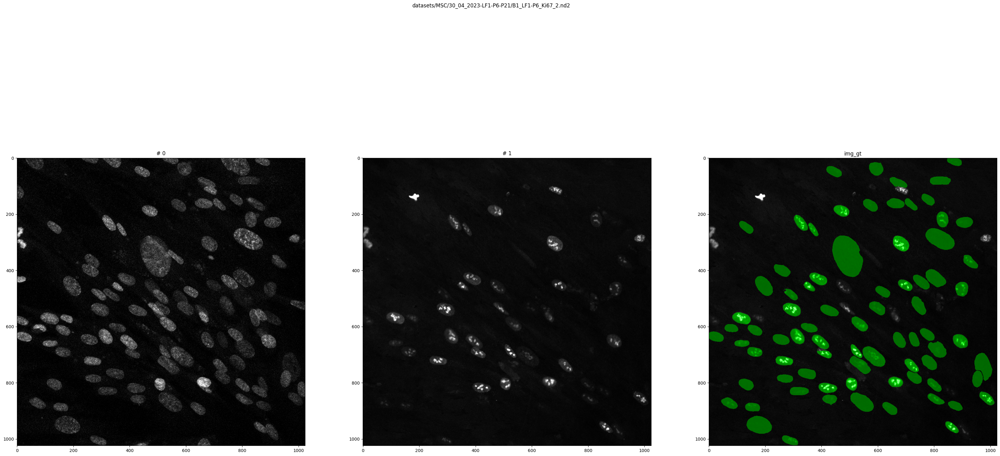

(2, 1024, 1024)
(1024, 1024)


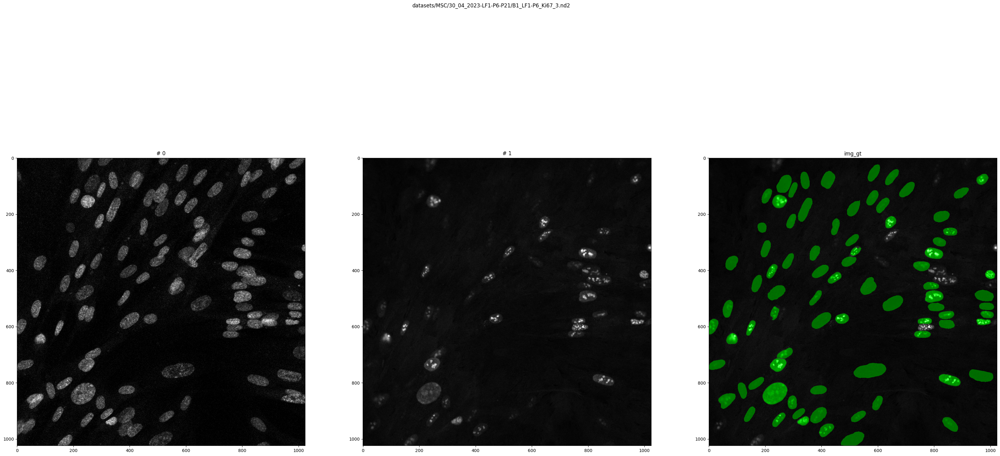

(2, 1024, 1024)
(1024, 1024)


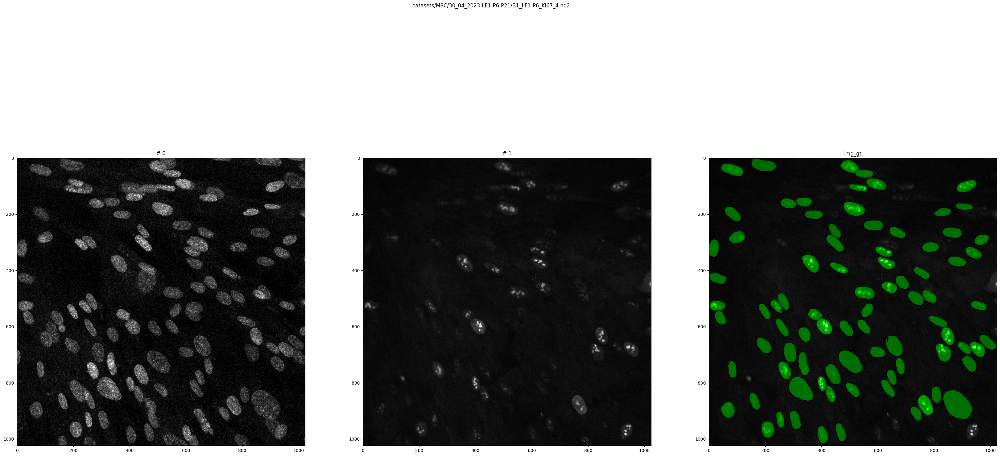

(2, 1024, 1024)
(1024, 1024)


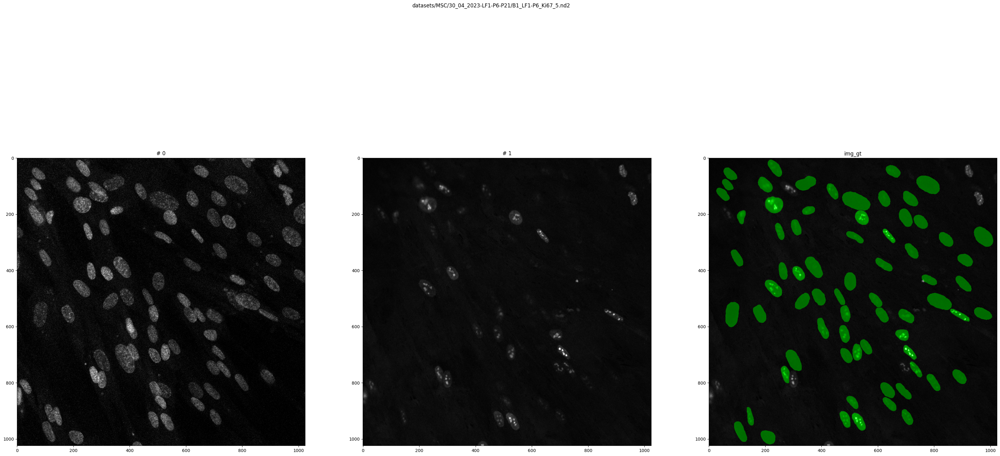

In [14]:
idx_first = 20
idx_total = 4
idx_last = idx_first + idx_total

for fn in fn_list[idx_first:idx_last]:
    fp = osp.join(dataset_dir, fn)
    mask_fp = osp.join(masks_dir, f'{fn}mask.png')

    np_data = nd2.imread(fp)
    mask = cv2.imread(mask_fp, cv2.IMREAD_GRAYSCALE)

    print(np_data.shape)
    print(mask.shape)
    # np_data.shape  # [c, w, h]
    # c = np_data.shape[0] + 1

    fig, ax = plt.subplots(1, c + 1, figsize=figsize)
    for c_idx in range(c):
        ax[c_idx].imshow(np_data[c_idx], cmap='gray', vmin=0, vmax=4095)
        ax[c_idx].title.set_text(f'# {c_idx}')
    # ax[-1].imshow(mask, cmap='gray', vmin=0, vmax=255)
    # ax[-1].title.set_text(f'mask')

    color_k = 100
    
    img_gt = np_data[c_idx].copy() / 4095
    img_gt3 = np.stack([img_gt, img_gt, img_gt], axis=2) * 255
    green_idx = mask == 255
    img_gt3[..., 0][green_idx] -= color_k
    img_gt3[..., 1][green_idx] += color_k
    img_gt3[..., 2][green_idx] -= color_k
    np.clip(img_gt3, 0, 255, out=img_gt3)
    img_gt3 = img_gt3.astype(np.uint8)
    ax[-1].imshow(img_gt3)
    ax[-1].title.set_text('img_gt')
    
    fig.suptitle(fp)
    plt.show()

In [6]:
def get_squares(orig_size, square_size, border):
    square_w, square_h = square_size

    # square_w_with_border = square_w + 2 * border
    # square_h_with_border = square_h + 2 * border
    # square_with_border_size = (square_w_with_border, square_h_with_border)

    square_w_num, square_h_num = int(np.ceil(w/square_w)), int(np.ceil(h/square_h))
    full_size = (square_w*square_w_num, square_h*square_h_num)
    full_size_with_borders = (full_size[0]+2*border, full_size[1]+2*border)

    squares = []
    for start_w_idx in range(square_w_num):
        start_w = start_w_idx * square_w
        end_w = (start_w_idx + 1) * square_w

        for start_h_idx in range(square_h_num):
            start_h = start_h_idx * square_h
            end_h = (start_h_idx + 1) * square_h

            square_coords = [start_w,
                             start_h,
                             end_w,
                             end_h]
            square_with_borders_coords = [start_w,
                                          start_h,
                                          end_w+2*border,
                                          end_h+2*border]
            square_with_borders_coords_rev = [start_w+border,
                                              start_h+border,
                                              end_w+border,
                                              end_h+border]

            square_info_dict = dict(w=start_w_idx,
                                    h=start_h_idx,
                                    square_coords=square_coords,
                                    square_with_borders_coords=square_with_borders_coords,
                                    square_with_borders_coords_rev=square_with_borders_coords_rev)
            squares.append(square_info_dict)

    return full_size, full_size_with_borders, squares

In [7]:
def split_on_squares(image, squares, param_name):
    img_sq_list = []
    for sq in squares:
        img_sq = image[:, sq[param_name][1]:sq[param_name][3], sq[param_name][0]:sq[param_name][2]].copy()
        img_sq_list.append(img_sq)

    return img_sq_list

In [8]:
def split_image(image, squares, border):
    c = image.shape[0]

    image_with_borders = []
    for c_idx in range(c):
        image_resized_cur_c = cv2.resize(image[c_idx], full_size, interpolation=cv2.INTER_NEAREST)
        image_with_borders_cur_c = cv2.copyMakeBorder(image_resized_cur_c, border, border, border, border, cv2.BORDER_REFLECT, None)
        image_with_borders.append(image_with_borders_cur_c)
    image_with_borders = np.stack(image_with_borders)

    img_sq_list = split_on_squares(image_with_borders, squares, 'square_with_borders_coords')

    return image_with_borders, img_sq_list

In [9]:
def unsplit_image(img_sq_list, squares, param_name, border):
    w_num, h_num = squares[-1]['w']+1, squares[-1]['w']+1
    square_size = (squares[0]['square_coords'][2], squares[0]['square_coords'][3])
    result_size = (img_sq_list[0].shape[0], square_size[0]*w_num, square_size[1]*h_num)
    result = np.zeros(result_size)
    for sq, img_sq in zip(squares, img_sq_list):
        result[:, sq[param_name][1]:sq[param_name][3], sq[param_name][0]:sq[param_name][2]] = img_sq[:, border:square_size[0]+border, border:square_size[1]+border]
    return result

In [10]:
def draw_square(image, sq, color):
    for c_idx in range(len(color)):
        image[c_idx][sq[1]:sq[3], sq[0]] = color[c_idx]
        image[c_idx][sq[1], sq[0]:sq[2]] = color[c_idx]
        image[c_idx][sq[1]:sq[3], sq[2]] = color[c_idx]
        image[c_idx][sq[3], sq[0]:sq[2]] = color[c_idx]

# Calculate squares coords

In [11]:
orig_size = (w, h)
square_w, square_h = 256, 256
square_size = (square_w, square_h)
border = 32

full_size, full_size_with_borders, squares = get_squares(orig_size, square_size, border)

print(f'orig_size: {orig_size}')
print(f'full_size: {full_size}')
print(f'full_size_with_borders: {full_size_with_borders}')
# pprint(core_square_sizes)
print(f'squares: {len(squares)}')

pprint(squares[:2])
print('...')
pprint(squares[-2:])

orig_size: (1024, 1024)
full_size: (1024, 1024)
full_size_with_borders: (1088, 1088)
squares: 16
[{'h': 0,
  'square_coords': [0, 0, 256, 256],
  'square_with_borders_coords': [0, 0, 320, 320],
  'square_with_borders_coords_rev': [32, 32, 288, 288],
  'w': 0},
 {'h': 1,
  'square_coords': [0, 256, 256, 512],
  'square_with_borders_coords': [0, 256, 320, 576],
  'square_with_borders_coords_rev': [32, 288, 288, 544],
  'w': 0}]
...
[{'h': 2,
  'square_coords': [768, 512, 1024, 768],
  'square_with_borders_coords': [768, 512, 1088, 832],
  'square_with_borders_coords_rev': [800, 544, 1056, 800],
  'w': 3},
 {'h': 3,
  'square_coords': [768, 768, 1024, 1024],
  'square_with_borders_coords': [768, 768, 1088, 1088],
  'square_with_borders_coords_rev': [800, 800, 1056, 1056],
  'w': 3}]


# Split images on squares (+test unsplit)

In [12]:
vmax = 4095
color = [vmax, vmax]
mask_color = [128]

# # draw one square with added borders
# sq_idx = 5
# color2 = [vmax/2, vmax/2]
# draw_square(np_data_with_borders_draw, squares[sq_idx]['square_with_borders_coords'], color2)

W = H = 15
figsize = (W*c, H)

img_with_borders_list = list()
mask_with_borders_list = list()

out_dir = 'datasets/MSC/30_04_2023-LF1-P6-P21_combined'
os.makedirs(out_dir, exist_ok=True)

for fn in tqdm(fn_list[:]):
    fp = osp.join(dataset_dir, fn)
    mask_fp = osp.join(masks_dir, f'{fn}mask.png')

    img = nd2.imread(fp)
    mask = cv2.imread(mask_fp, cv2.IMREAD_GRAYSCALE)[np.newaxis, ...]

    assert img.shape == (2, 1024, 1024)
    assert mask.shape == (1, 1024, 1024)

    # split
    img_with_borders, img_sq_list = split_image(img, squares, border)
    mask_with_borders, mask_sq_list = split_image(mask, squares, border)

    # unsplit
    unsplit_img = unsplit_image(img_sq_list, squares, 'square_coords', border)
    unsplit_mask = unsplit_image(mask_sq_list, squares, 'square_coords', border)

    assert unsplit_img.shape == (2, 1024, 1024)
    assert unsplit_mask.shape == (1, 1024, 1024)

    assert np.abs((unsplit_img - img)).max() == 0  # 0 -> equal
    assert np.abs((unsplit_mask - mask)).max() == 0  # 0 -> equal

#     img_with_borders_draw = img_with_borders.copy()
#     mask_with_borders_draw = mask_with_borders.copy()
#     print(fn)
#     for sq in squares:
#         draw_square(img_with_borders_draw, sq['square_with_borders_coords_rev'], color)
#         draw_square(mask_with_borders_draw, sq['square_with_borders_coords_rev'], mask_color)

#     fig, ax = plt.subplots(1, c+3, figsize=figsize)
#     for c_idx in range(c):
#         ax[c_idx].imshow(img_with_borders_draw[c_idx],
#                          cmap='gray', vmin=0, vmax=vmax)
#     ax[2].imshow(mask_with_borders_draw[0],
#                  cmap='gray', vmin=0, vmax=255)

#     # plt.show()

#     image3ch = np.stack([img_with_borders_draw[0]/16] * 3).transpose(1, 2, 0).astype(int)
#     image3ch[..., 0][mask_with_borders[0] == 255] -= 50
#     image3ch[..., 1][mask_with_borders[0] == 255] += 50
#     image3ch[..., 2][mask_with_borders[0] == 255] -= 50
#     ax[3].imshow(image3ch)

#     image3ch = np.stack([img_with_borders_draw[1]/16] * 3).transpose(1, 2, 0).astype(int)
#     image3ch[..., 0][mask_with_borders[0] == 255] -= 50
#     image3ch[..., 1][mask_with_borders[0] == 255] += 50
#     image3ch[..., 2][mask_with_borders[0] == 255] -= 50
#     ax[4].imshow(image3ch)

# fig.savefig(osp.join(out_dir, f'{fn[:-4]}.png'),
#             bbox_inches='tight',
#             transparent=False,
#             pad_inches=0)

#     plt.show()


100%|█████████████████████████████████████████████████████████████████████████████████████████████| 235/235 [00:05<00:00, 42.71it/s]


In [15]:
# W = H = 15
# figsize = (W*c, H)

# fig, ax = plt.subplots(1, c + 1, figsize=figsize)
# for c_idx in range(c):
#     ax[c_idx].imshow(unsplit_img[c_idx],
#                      cmap='gray', vmin=0, vmax=vmax)
# ax[-1].imshow(unsplit_mask[0],
#               cmap='gray', vmin=0, vmax=255)